In [ ]:
#Mount GDrive for reading images stored in GDrive

from google.colab import drive
drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [ ]:
# Get image names from a GDrive directory
import os
# getting train images
train_path = './gdrive/MyDrive/BSDS300/images/train/'  # getting path of training images
train_imageNames = []  # for stroing train images
test_imageNames = []  # for storing test images
for i in os.scandir(train_path): # iterating for all train images
    train_imageNames.append(i.path)  # appending each train image

test_path = './gdrive/MyDrive/BSDS300/images/test/'  # getting path of testing images
for i in os.scandir(test_path):  # iterating for all test images
    test_imageNames.append(i.path)  # appending all test images
test_images = test_imageNames[0:2] # we will just consider five images for testing out of which 3 will be artificailly blurred

# cv(cv2.imread(test_images[2]))



uint8
(481, 321, 3)


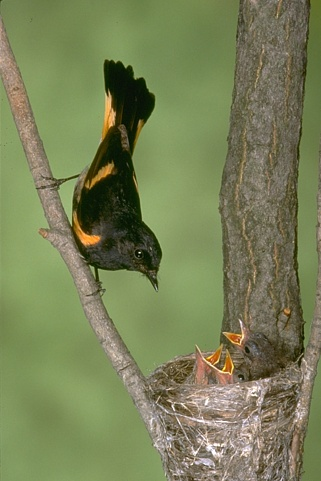

In [ ]:
# Read one image and display it
import matplotlib.pyplot as plt
import cv2
from google.colab.patches import cv2_imshow as cv
import warnings

imageNum = 5 # Eleventh image in the directory will be read
train_img  = cv2.imread(train_imageNames[imageNum]) # read one test image
# test_img = cv2.cvtColor(test_img, cv2.COLOR_BGR2RGB)

# Print image attributes
print(train_img.dtype)
print(train_img.shape)

# Display image
# plt.imshow(test_img)
cv(train_img)




In [ ]:
# This function will take the large patches of the all image and returns allsubpatches with corresponding central pixel values
def get_train_patches(clear_patches, degraded_patches, w):
    input = []
    output = []
    for i in range(clear_patches.shape[0]):  # iterating for total number of images
        for j in range(clear_patches.shape[1]):  # iteration for total number of large patches in a single image
            for k in range(0, clear_patches.shape[2]-w+1):  # iterating the single large patch with small window in x dim
                for l in range(0, clear_patches.shape[3]-w+1):  # iterating the single large patch with small window in y dim
                    input.append(degraded_patches[i,j,k:k+w,l:l+w,:])  # appending the single small windowed input
                    output.append(clear_patches[i,j,np.int((2*k+w)/2),np.int((2*l+w)/2),:]) # appending the corresponding central pixel
    return np.array(input), np.array(output)  # returning input and output

In [ ]:
# to get flattened train patches for training ann's
def get_train_patches_flattened(clear_patches, degraded_patches, w):
    input = []
    output = []
    for i in range(clear_patches.shape[0]):  # iterating for total number of images
        for j in range(clear_patches.shape[1]):  # iteration for total number of large patches in a single image
            for k in range(0, clear_patches.shape[2]-w+1):  # iterating the single large patch with small window in x dim
                for l in range(0, clear_patches.shape[3]-w+1):  # iterating the single large patch with small window in y dim
                    input.append(degraded_patches[i,j,k:k+w,l:l+w,:].flatten())  # appending the single small flattened windowed input
                    output.append(clear_patches[i,j,np.int((2*k+w)/2),np.int((2*l+w)/2),:]) # appending the corresponding central pixel
    return np.array(input), np.array(output)  # returning input and output

In [ ]:
# function for extractins separate rgb channels sub-patches  using large patch obtained in the extract_train_patches function
# g , r, b respectively implies green, red and blue channels respectively.

def get_separate_train_patches(clear_patches, degraded_patches, w):
    g_input = []
    r_input = []
    b_input = []
    g_output = []
    r_output = []
    b_output = []
    for i in range(clear_patches.shape[0]):  # iterating for total number of images
        for j in range(clear_patches.shape[1]):  # iteration for total number of large patches in a single image
            for k in range(0, clear_patches.shape[2]-w+1):   # iterating the single large patch with small window in x dim
                for l in range(0, clear_patches.shape[3]-w+1):  # iterating the single large patch with small window in y dim
                    g_input.append(degraded_patches[i,j,k:k+w,l:l+w,0].flatten())
                    r_input.append(degraded_patches[i,j,k:k+w,l:l+w,1].flatten())   # appending small windowed input of each channel separately
                    b_input.append(degraded_patches[i,j,k:k+w,l:l+w,2].flatten())
                    g_output.append(clear_patches[i,j,np.int((2*k+w)/2),np.int((2*l+w)/2),0])
                    r_output.append(clear_patches[i,j,np.int((2*k+w)/2),np.int((2*l+w)/2),1])  # appending the corresponding central pixels
                    b_output.append(clear_patches[i,j,np.int((2*k+w)/2),np.int((2*l+w)/2),2])
    return np.array(g_input), np.array(r_input), np.array(b_input), np.array(g_output), np.array(r_output), np.array(b_output)  # returning input and output
# input, output = extract_train_patches(train_imageNames, blur_train_image, 0)

In [ ]:
# input = training images, blurred training images, separate channels(whether we want separate channels or not), number of large patches in single image, whether to flatten in 3d or not
# note that we have to change the value of W, w in two places one inside the function and one outside the function
import numpy as np
import random
import cv2
W = 23
w=13
def extract_train_patches(imageNames, blur_image, separate_channels, numPatches, flatten):  # to extract patches

    W = 23 # Patch max window size
    w = 13 # sub-patch window size
    input = []
    output = []
    clear_patches = np.empty((len(imageNames),numPatches,W,W,3), dtype=float) # clear patches size
    degraded_patches = np.empty((len(imageNames),numPatches,W,W,3), dtype=float)  # degraded patches size 
    for j in range(len(imageNames)): # iterating for total number of images
        for i in range(numPatches): # For number of patches
            temp = cv2.imread(imageNames[j])  # converting clear image into array
            temp1 = blur_image[j]  # taking blur image
            x = random.randint(0, temp.shape[0]-W) # Random x location so that the patch 
                                                # remains within image boundaries
            y = random.randint(0, temp.shape[1]-W) # Random y location
                                                # remains within image boundaries
            degraded_patches[j,i,:,:,:] = temp1[x:x+W,y:y+W,:]/1.0 # Extract patch from degraded image
            clear_patches[j,i,:,:,:] = temp[x:x+W, y:y+W, :]/1.0  # extract central pixel value from clear image
    if separate_channels==0:  # if we don't want intensities in separate rgb channels
        if flatten==0:
            input, output = get_train_patches(clear_patches,degraded_patches, w)  
        # print(clear_patches[0,0,11,11,:])
        else:
            input, output = get_train_patches_flattened(clear_patches, degraded_patches, w) 
        return input, output
    else:  # if we want r,g,b separately
        gi,ri,bi,go,ro,bo = get_separate_train_patches(clear_patches,degraded_patches, w)
        return gi,ri,bi,go,ro,bo
    # Display sub-patch
            #cv(cv2.resize(patches[i,np.int((W-w)/2):np.int(W-(W-w)/2),np.int((W-w)/2):np.int(W-(W-w)/2),:]*255, (200, 200)))


In [ ]:
def padding(img, pads):  # for zero padding the image
    padding_img = np.zeros((img.shape[0] + 2 * pads, img.shape[1] + 2 * pads, 3), dtype=np.uint8)  # creating the entire shape of image with all zeros
    for i in range(3):
        padding_img[pads:padding_img.shape[0] - pads, pads:padding_img.shape[1] - pads, i] = img[:,:,i]  # only copying the original image part into the above matrix and remaining will be zeros
    return padding_img  # returning the padded image

The above function will do padding for the test images

In [ ]:

## get image patches combinely for three channels for test image ####
def get_test_patches(clear, degraded, w):
    input = []
    output = []
    padded_image = degraded
    x_shape = clear.shape[0]
    y_shape = clear.shape[1]
    # There will be total of x_shape*y_shape patches 
    for i in range(0,x_shape-w+1):  # for sliding window across x dim
        for j in range(0,y_shape-w+1):  # for sliding window across y dim
            input.append(padded_image[i:i+w, j:j+w, :])  # getting windowed input
            output.append(clear[np.int((2*i+w)/2),np.int((2*j+w)/2),:])  # getting corresponding central pixel value
    
    return np.array(input), np.array(output)
# i, o = get_test_patches(train_img, blur_train_image[imageNum], 23)
# result = combine_central_pixels(train_img.shape[0], train_img.shape[1], o) 
# cv(result)

In [ ]:
# extracts the flattened inputs for every window
def get_test_patches_flatten(clear, degraded, w):
    input = []
    output = []
    padded_image = degraded
    x_shape = clear.shape[0]
    y_shape = clear.shape[1]
    # There will be total of x_shape*y_shape patches 
    for i in range(0,x_shape-w+1):  # for sliding window across x dim
        for j in range(0,y_shape-w+1):  # for sliding window across y dim
            input.append(padded_image[i:i+w, j:j+w, :].flatten())  # getting windowed input
            output.append(clear[np.int((2*i+w)/2),np.int((2*j+w)/2),:])  # getting corresponding central pixel value
    
    return np.array(input), np.array(output)

The above function will return the patches and the corresponding central pixel values for the degraded test images in third dimension form.

In [ ]:
#  The function combines the predicted central value pixels to get predicted clear image
def combine_central_pixels(x_shape, y_shape, output):
    result_img = np.empty((x_shape, y_shape, 3), dtype=int)  # to store the predicted clear image values
    l = 0
    
    for i in range(x_shape):  # iterating across x dim
        for j in range(y_shape):  # iterating across y dim
            result_img[i,j,:] = (output[l,:])  # storing the predicted intensities in result
            l += 1
    return result_img

The above function will combine the central pixel intensity values of output in 3D form  to form the original clear image.

In [ ]:
## get image patches separately for each channel separately for test images #######
# g,r,b, corresponds to green, red and blue channels 

def get_separate_test_patches(clear, degraded, w):
    g_input = []
    r_input = []
    b_input = []
    g_output = []
    r_output = []
    b_output = []

    padded_image = degraded
    x_shape = clear.shape[0]
    y_shape = clear.shape[1]
    # There will be total of x_shape*y_shape patches 
    for i in range(0,x_shape-w+1):
        for j in range(0,y_shape-w+1):
            g_input.append(padded_image[i:i+w, j:j+w, 0].flatten())  # flattening the corresponding channels windowed input
            r_input.append(padded_image[i:i+w, j:j+w, 1].flatten())
            b_input.append(padded_image[i:i+w, j:j+w, 2].flatten())
            g_output.append(clear[np.int((2*i+w)/2)][np.int((2*j+w)/2)][0])
            r_output.append(clear[np.int((2*i+w)/2)][np.int((2*j+w)/2)][1])  # storing the corresponding central pixel value
            b_output.append(clear[np.int((2*i+w)/2)][np.int((2*j+w)/2)][2])
    return np.array(g_input), np.array(r_input), np.array(b_input), np.array(g_output), np.array(r_output), np.array(b_output)

# gi, ri, bi, go, ro, bo = get_separate_test_patches(train_img, blur_train_image[imageNum], 23)

# result = combine_central_pixels_rgb(train_img.shape[0], train_img.shape[1],go, ro, bo)  


The above function will take test images and will pad it according to window size, and then return red, blue, green central pixel intensities separately along with the corresponding patches of red, blue, green channels separately.

In [ ]:
# inputs = red , blue , green predicted output intensities, x size, y size
# output = resultant predicted image
def combine_central_pixels_rgb(x_shape, y_shape, green, red, blue):
    result_img = np.empty((x_shape, y_shape, 3), dtype=int)
    l = 0
    for i in range(x_shape):
        for j in range(y_shape):
            result_img[i,j,0] = np.int(green[l])  # green intensity
            result_img[i,j,1] = np.int(red[l])  # red intensity
            result_img[i,j,2] = np.int(blue[l])  # blue intensity
            l += 1
    return result_img

The function combine_central_pixels_rgb takes green, red, blue central pixel intensities obtained from methods  separately and combine then to form resultant image.

In [ ]:
# adding gaussian noise with mean 0 and random variance
# input = image to be blurred 
# output = blurred image 
import numpy as np
import random
def add_gaussian_noise(img):
    x, y = img.shape[0], img.shape[1]  # shape of x, y
    variance_noise = np.arange(1, 5, 0.01)  # variance is chosen randomly from the beside set
    mean = 0  # mean of noise
    sigma = random.choice(variance_noise)  # variance of noise
    noise = np.random.normal(mean, sigma, (x,y,3))  # generating noise samples from standard distribution
    result = img+noise  # adding noise to original image
    return result

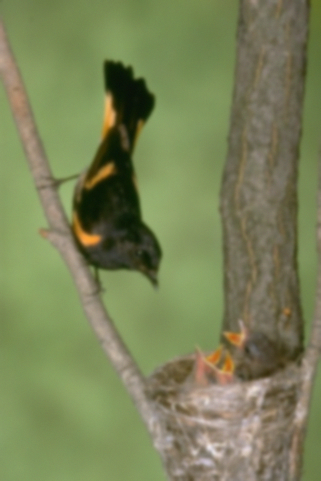

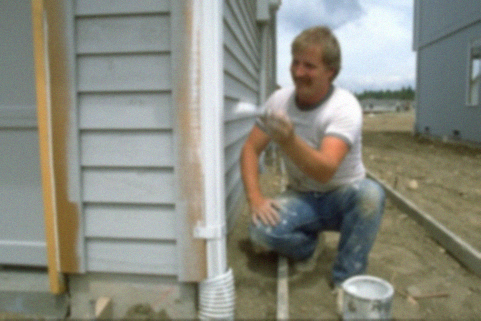

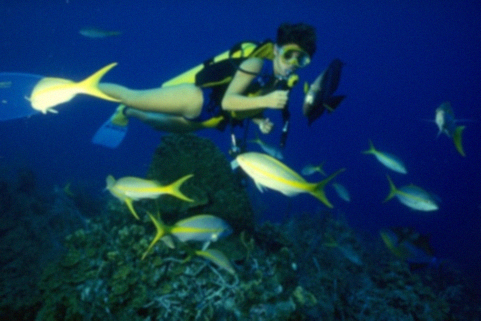

In [ ]:
# display one image when random gaussian blur and noise are added.

import numpy as np 
import random
blur_train_image = []
blur_test_image = []
sigma_set = np.arange(1,2,0.1)


for i in range(len(train_imageNames)):  # iterating for train images
    sigma = random.choice(sigma_set)  #  choosing sigma randomly from the above set
    temp = cv2.imread(train_imageNames[i])  # converting original to array for blurring and adding noise
    temp1 =add_gaussian_noise(cv2.GaussianBlur(temp,ksize = (13,13), sigmaX=sigma, sigmaY=sigma, borderType = cv2.BORDER_DEFAULT))  # blurring and adding noise
    blur_train_image.append(temp1)  # storing degraded image
for i in range(0,3):
    cv(blur_train_image[imageNum+i])  # displaying 3 degraded images





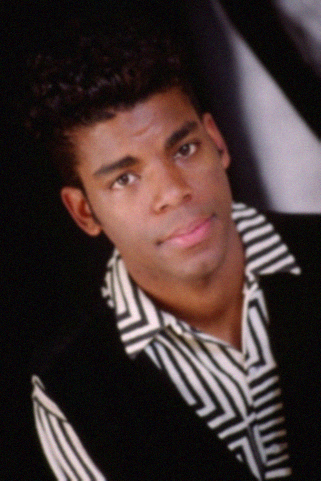

In [ ]:
### degrading test images and dispalying one test image ############
# input = test images
# output = degraded test images
for i in range(len(test_images)):
    sigma = random.choice(sigma_set)
    temp = cv2.imread(test_images[i])
    temp1 = add_gaussian_noise(cv2.GaussianBlur(temp,ksize = (13,13), sigmaX=sigma, sigmaY=sigma, borderType = cv2.BORDER_DEFAULT))
    blur_test_image.append(temp1)
cv(blur_test_image[0])

In [ ]:
### preparing dataset for convolutional neural networks ##########
x, y = extract_train_patches(train_imageNames, blur_train_image, 0, 10, 0)  # x is features set and y is corresponding central pixel value


In [ ]:
### extracting test images patches and corresponding central pixels for comparison ###

img1 = cv2.imread(test_images[0])  # converting clear test image to array   
#cv(img1)
x_test1, y_test1 = get_test_patches(img1, blur_test_image[0], w)  # extracting degraded test patches and original central pixel values for comparison with predicted values
#print(img1.shape)
#print(len(x_test), len(y_test))

# same is done for image 2
img2 = cv2.imread(test_images[1])
#cv(img2)
x_test2, y_test2 = get_test_patches(img2, blur_test_image[1], w)
                                  

# same is done for third image but we don't know the central clear pixel values since it is real life image                               
img4 = cv2.imread(test_imageNames[2])
img4 = cv2.resize(img4,(500, 500))
#cv(img3)
#print(img3.shape)
x_test4, y_test4 = get_test_patches(img4, img4, w)
#print(len(x_test3), len(y_test3))

# same is done for fourth image and we don't know the central clear pixel values since it is real life image                                                     
img5 = cv2.imread(test_imageNames[3])
img5 = cv2.resize(img5, (500,500))
#cv(img3)
#print(img3.shape)
x_test5, y_test5 = get_test_patches(img5, img5, w)
#print(len(x_test3), len(y_test3))

In [ ]:
print(x.shape, y.shape)

(242000, 13, 13, 3) (242000, 3)


# 1st Model using CNN with shallow neural network

In [ ]:
############### using CNN ###############
import tensorflow as tf
from keras.models import Sequential
from keras.layers import Dense, Flatten, Conv2D, MaxPool2D, Dropout
import keras.optimizers
from sklearn.model_selection import train_test_split
                                                    
#  splitting training set for validation and training                                          
x_train, x_dev, y_train, y_dev = train_test_split(x, y, test_size=0.1, random_state=2019)   

# for early stopping
callback = tf.keras.callbacks.EarlyStopping(monitor='loss', patience = 10) 

# initialising model with sequential
model1 = Sequential()

#  adding the wanted layers
model1.add(Conv2D(32, kernel_size=3, activation='relu',padding='same', input_shape=(w,w,3)))  # adds 2d convolution layer
model1.add(MaxPool2D(strides=2))  # pooling layer with strides 2
model1.add(Conv2D(64, kernel_size=3, padding='valid', activation='relu'))  # adds convolution layer
model1.add(MaxPool2D(strides=2))  # pooling layer

model1.add(Flatten())  # flatten the output from above neurons
model1.add(Dense(128, activation='relu'))  # normal hidden layer with 128 neurons
#model1.add(Dropout(0.5))
model1.add(Dense(64, activation='relu'))  # hidden layer with 64 neurons
#model1.add(Dropout(0.5))
model1.add(Dense(3, activation='relu'))  # output layer with 3 neurons

# compiling the model and fitting to the training set, and then predicting the testing values
model1.compile(loss='mean_squared_error', optimizer='adam', metrics=['accuracy'])  # compile the above model
model1.fit(x_train, y_train, validation_data=(x_dev, y_dev), epochs=50, batch_size=64, callbacks=[callback])  # fit to the training data

Epoch 1/50
3404/3404 [==============================] - 53s 15ms/step - loss: 235.1472 - accuracy: 0.9025 - val_loss: 194.3114 - val_accuracy: 0.9179
Epoch 2/50
3404/3404 [==============================] - 52s 15ms/step - loss: 165.5817 - accuracy: 0.9117 - val_loss: 156.9813 - val_accuracy: 0.9131
Epoch 3/50
3404/3404 [==============================] - 53s 15ms/step - loss: 157.0902 - accuracy: 0.9145 - val_loss: 236.7327 - val_accuracy: 0.8859
Epoch 4/50
3404/3404 [==============================] - 52s 15ms/step - loss: 154.2789 - accuracy: 0.9185 - val_loss: 150.8505 - val_accuracy: 0.9290
Epoch 5/50
3404/3404 [==============================] - 52s 15ms/step - loss: 150.6315 - accuracy: 0.9190 - val_loss: 146.2305 - val_accuracy: 0.9317
Epoch 6/50
3404/3404 [==============================] - 52s 15ms/step - loss: 147.8448 - accuracy: 0.9199 - val_loss: 151.8095 - val_accuracy: 0.9297
Epoch 7/50
3404/3404 [==============================] - 52s 15ms/step - loss: 145.6255 - accuracy: 0

In [ ]:
# for predicting the central pixel values of test images
y_pre1 = model1.predict(x_test1)
y_pre2 = model1.predict(x_test2)
# y_pred3 = model1.predict(x_test3)
y_pre4 = model1.predict(x_test4)
y_pre5 = model1.predict(x_test5)

In [ ]:
########## for printing 4 test images #############
from sklearn.metrics import mean_squared_error as mse

def Print(img1, img2, img4, img5, blur_test_image, y_pred1, y_pred2,  y_pred4, y_pred5, y_test1, y_test2,  y_test4, y_test5, w):
    
    pred_1 = combine_central_pixels(np.array(blur_test_image[0]).shape[0]-w+1, np.array(blur_test_image[0]).shape[1]-w+1, y_pred1.astype(int))  # estimating predicted image
    print("######################################## Displaying first test image ########################################")
    print("MSE of the image is "+ str(mse(y_pred1,y_test1)))
    print("### Predicted Clear Image ###")
    cv(pred_1)
    print("### Original Degraded Image ###")
    cv(blur_test_image[0])
    print("### Original Clear Image ###")
    cv(img1)


    pred_2 = combine_central_pixels(np.array(img2).shape[0]-w+1, np.array(img2).shape[1]-w+1, y_pred2.astype(int))
    print("########################################## Displaying second test image ##################################")
    print("MSE of the image is "+ str(mse(y_pred2,y_test2)))
    print("### Predicted Clear Image ###")
    cv(pred_2)
    print("### Original Degraded Image ###")
    cv(blur_test_image[1])
    print("### Original Clear Image ###")
    cv(img2)


    
    # pred_3 = combine_central_pixels(np.array(img3).shape[0]-w+1, np.array(img3).shape[1]-w+1, y_pred3.astype(int))
    # print("################################# Displaying third test image ###########################################")
    # print("MSE of the image is "+ str(mse(y_pred3,y_test3)))
    # print("### Predicted Clear Image ###")
    # cv(pred_3)
    # print("### Original Degraded Image ###")
    # cv(blur_test_image[2])
    # print("### Original Clear Image ###")
    # cv(img3)

    pred_4 = combine_central_pixels(np.array(img4).shape[0]-w+1, np.array(img4).shape[1]-w+1, y_pred4.astype(int))
    print("############################## Displaying fourth real test image ###############################")
    # print("MSE of the image is "+ str(mse(y_pred4,y_test4)))
    print("### Predicted Clear Image ###")
    cv(pred_4)
    print("### Original Real Life Degraded Image ###")
    cv(img4)

    pred_5 = combine_central_pixels(np.array(img5).shape[0]-w+1, np.array(img5).shape[1]-w+1, y_pred5.astype(int))
    print("############################## Displaying fifth real test image #################################")
    # print("MSE of the image is "+ str(mse(y_pred5,y_test5)))
    print("### Predicted Clear Image ###")
    cv(pred_5)
    print("### Original Real Life Degraded Image ###")
    cv(img5)

# Results of 1st model using CNN 

######################################## Displaying first test image ########################################
MSE of the image is 87.51547
### Predicted Clear Image ###


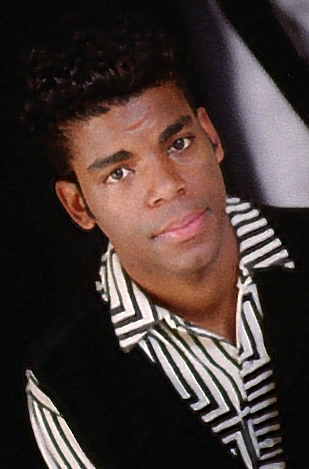

### Original Degraded Image ###


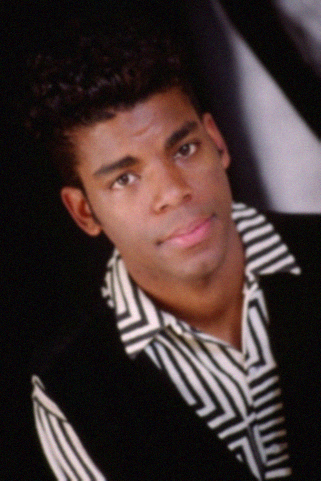

### Original Clear Image ###


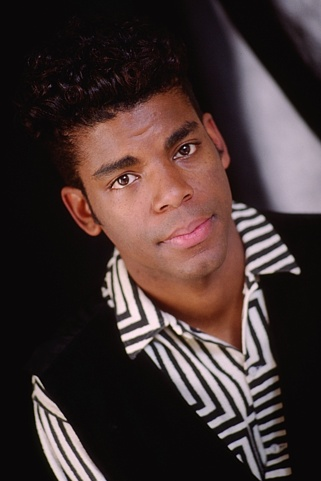

########################################## Displaying second test image ##################################
MSE of the image is 130.61263
### Predicted Clear Image ###


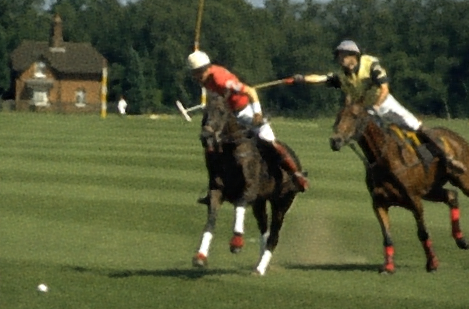

### Original Degraded Image ###


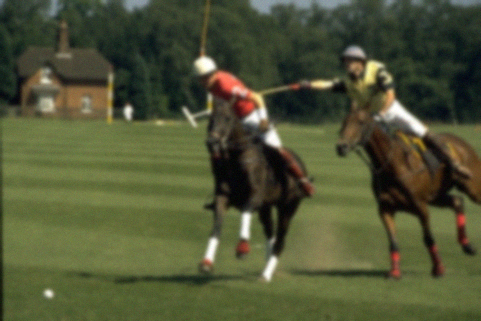

### Original Clear Image ###


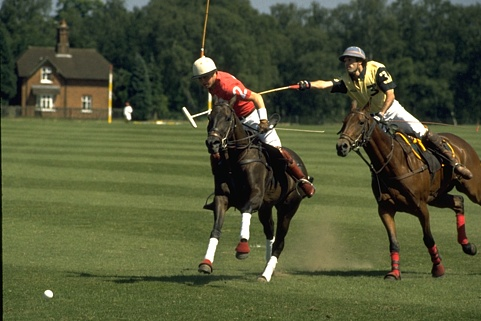

############################## Displaying fourth real test image ###############################
### Predicted Clear Image ###


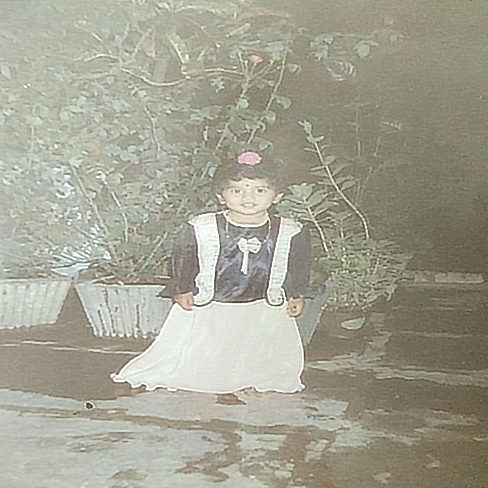

### Original Real Life Degraded Image ###


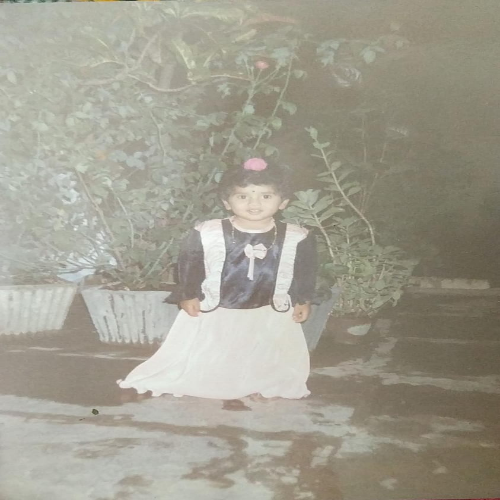

############################## Displaying fifth real test image #################################
### Predicted Clear Image ###


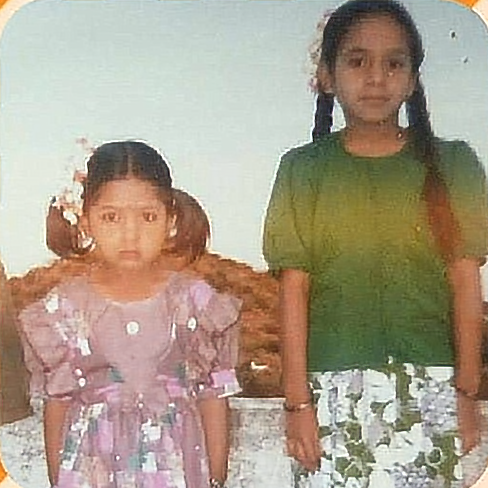

### Original Real Life Degraded Image ###


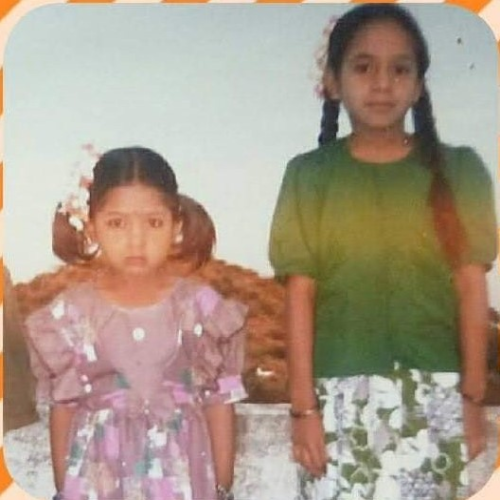

In [ ]:
Print(img1, img2, img4, img5, blur_test_image, y_pre1, y_pre2, y_pre4, y_pre5, y_test1, y_test2, y_test4, y_test5, w)

# 2nd model using above CNN but with one extra hidden layer

In [ ]:
# added one more layer to the above CNN model
#################### using compex CNN model #####################
import tensorflow as tf
from keras.models import Sequential
from keras.layers import Dense, Flatten, Conv2D, MaxPool2D, Dropout
import keras.optimizers
from sklearn.model_selection import train_test_split

x_train, x_dev, y_train, y_dev = train_test_split(x, y, test_size=0.1, random_state=2019)

callback = tf.keras.callbacks.EarlyStopping(monitor='loss', patience = 20) 

# initialising the above model, adding layers wanted, fitting the training data, and then predicting values
model = Sequential()

model.add(Conv2D(32, kernel_size=3, activation='relu', padding='same', input_shape=(w,w,3)))  # adding 2d convolution layer
model.add(MaxPool2D(strides=2))  # adding pooling layer with stride 2
model.add(Conv2D(64, kernel_size=3, padding='valid', activation='relu'))  # adding another convolutional layer
model.add(MaxPool2D(strides=2))  # adding pooling layer with stride 2

model.add(Flatten())  # flatten the output from above layer
model.add(Dense(256, activation='relu'))  # hidden layer with 256 neurons

model.add(Dense(128, activation='relu'))  # hidden layer with 128 neurons

model.add(Dense(64, activation='relu'))  # hidden layer with 64 neurons

model.add(Dense(3, activation='relu'))  # output layer with 3 neurons
model.compile(loss='mean_squared_error', optimizer='adam', metrics=['accuracy'])  # compile the above model
model.fit(x_train, y_train, validation_data=(x_dev, y_dev), epochs=50, batch_size=64, callbacks=[callback])  # fit the training data

Epoch 1/50
3404/3404 [==============================] - 55s 16ms/step - loss: 225.1791 - accuracy: 0.9041 - val_loss: 170.7755 - val_accuracy: 0.8900
Epoch 2/50
3404/3404 [==============================] - 54s 16ms/step - loss: 168.4785 - accuracy: 0.9158 - val_loss: 158.1130 - val_accuracy: 0.9104
Epoch 3/50
3404/3404 [==============================] - 53s 16ms/step - loss: 160.0786 - accuracy: 0.9185 - val_loss: 195.6532 - val_accuracy: 0.9383
Epoch 4/50
3404/3404 [==============================] - 53s 16ms/step - loss: 156.1720 - accuracy: 0.9205 - val_loss: 165.6008 - val_accuracy: 0.8548
Epoch 5/50
3404/3404 [==============================] - 53s 16ms/step - loss: 152.8130 - accuracy: 0.9214 - val_loss: 146.7499 - val_accuracy: 0.9298
Epoch 6/50
3404/3404 [==============================] - 55s 16ms/step - loss: 149.8203 - accuracy: 0.9241 - val_loss: 145.3693 - val_accuracy: 0.9339
Epoch 7/50
3404/3404 [==============================] - 54s 16ms/step - loss: 147.3094 - accuracy: 0

In [ ]:
# predicting the central pixel values of test images
y_pred1 = model.predict(x_test1)
y_pred2 = model.predict(x_test2)
# y_pred3 = model.predict(x_test3)
y_pred4 = model.predict(x_test4)
y_pred5 = model.predict(x_test5)

# Results of 2nd model

######################################## Displaying first test image ########################################
MSE of the image is 73.85378
### Predicted Clear Image ###


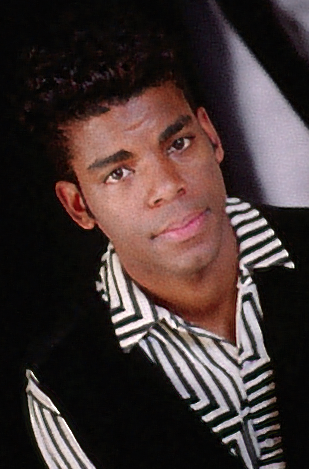

### Original Degraded Image ###


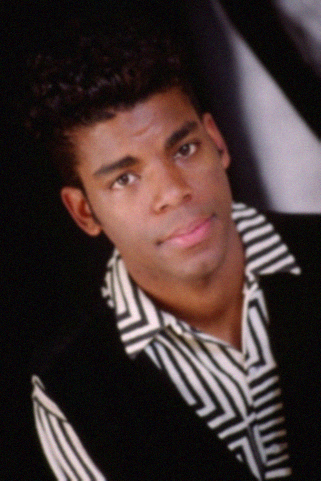

### Original Clear Image ###


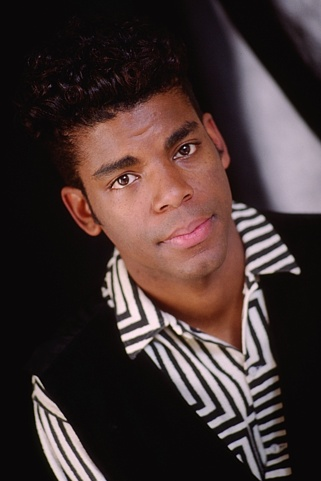

########################################## Displaying second test image ##################################
MSE of the image is 128.45763
### Predicted Clear Image ###


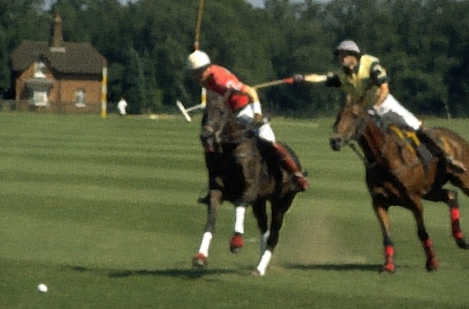

### Original Degraded Image ###


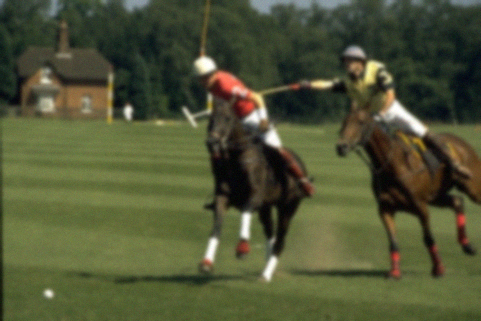

### Original Clear Image ###


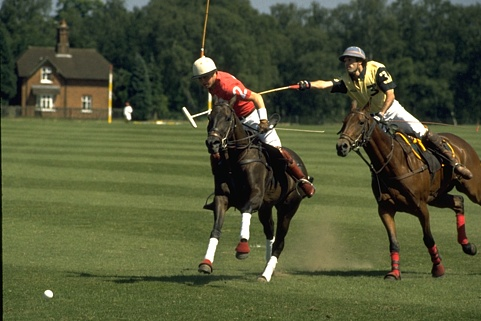

############################## Displaying fourth real test image ###############################
### Predicted Clear Image ###


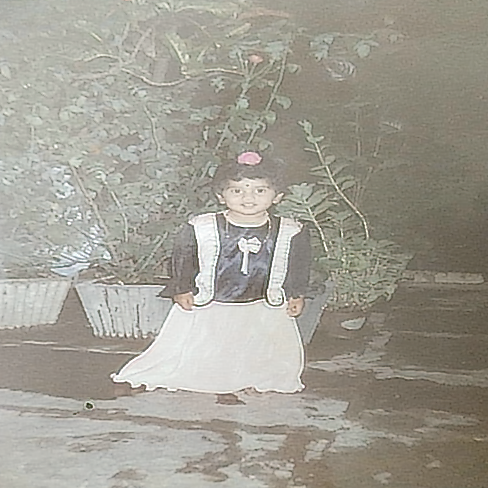

### Original Real Life Degraded Image ###


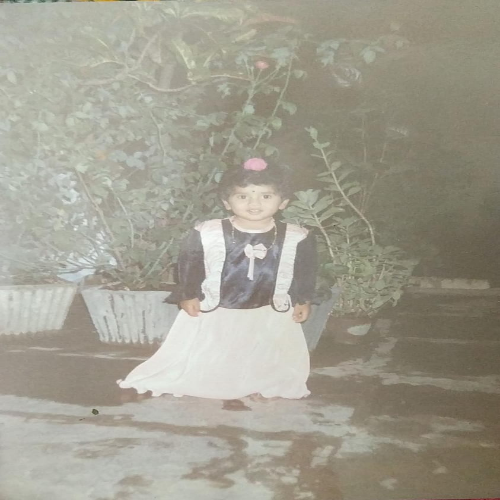

############################## Displaying fifth real test image #################################
### Predicted Clear Image ###


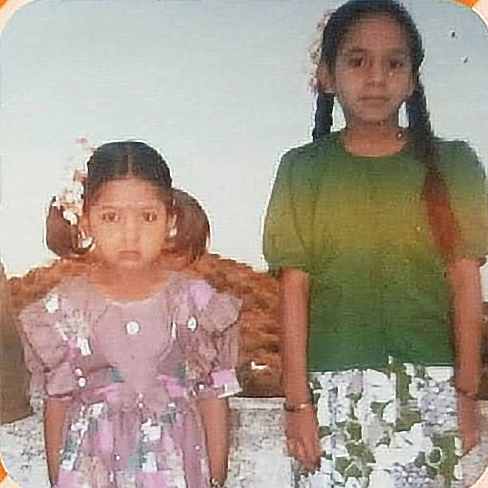

### Original Real Life Degraded Image ###


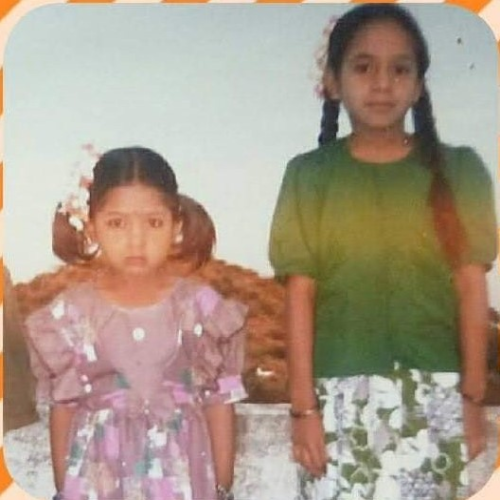

In [ ]:
Print(img1, img2, img4, img5, blur_test_image, y_pred1, y_pred2, y_pred4, y_pred5, y_test1, y_test2, y_test4, y_test5, w)

In [ ]:
# deleting the below variables for RAM if necessary
del(x,y, x_test1, x_test2, x_test4, x_test5)

# 3rd model using just artificial neural networks

In [ ]:

######### artificial neural networks #########
# we will train 3 separate models for green, red , blue 
# getting data for training

xg_train, xr_train, xb_train, yg_train, yr_train, yb_train = extract_train_patches(train_imageNames, blur_train_image, 1, 1, 0)


In [ ]:
############ extracting test related patches ########



img1 = cv2.imread(test_images[0])
x1g_test, x1r_test, x1b_test, y1g_test, y1r_test, y1b_test = get_separate_test_patches(img1, blur_test_image[0], w)

img2 = cv2.imread(test_images[1])
x2g_test, x2r_test, x2b_test, y2g_test, y2r_test, y2b_test = get_separate_test_patches(img2, blur_test_image[1], w)


img4 = cv2.imread(test_imageNames[2])
img4 = cv2.resize(img4,(500,500))
x4g_test, x4r_test, x4b_test, y4g_test, y4r_test, y4b_test = get_separate_test_patches(img4, img4, w)

img5 = cv2.imread(test_imageNames[3])
img5 = cv2.resize(img5,(500,500))
x5g_test, x5r_test, x5b_test, y5g_test, y5r_test, y5b_test = get_separate_test_patches(img5, img5, w)

In [ ]:
# using ann model for green colour 
import tensorflow as tf
from keras.models import Sequential
from keras.layers import Dense, Dropout
import keras.optimizers
from sklearn.model_selection import train_test_split

callback = tf.keras.callbacks.EarlyStopping(monitor='loss', patience = 20) 
x_train, x_dev, y_train, y_dev = train_test_split(xg_train, yg_train, test_size=0.1, random_state=2019)

model31 =Sequential()
model31.add(Dense(w*w, activation='relu'))

model31.add(Dense(1024, activation='relu'))

model31.add(Dense(256, activation='relu'))

model31.add(Dense(64, activation='relu'))
model31.add(Dense(1, activation='relu'))
model31.compile(loss='mean_squared_error', optimizer='adam', metrics=['mean_squared_error'])
model31.fit(x_train, y_train, validation_data=(x_dev,y_dev), epochs=50, batch_size=64, callbacks=[callback])

Epoch 1/50
341/341 [==============================] - 5s 13ms/step - loss: 339.5987 - mean_squared_error: 339.5987 - val_loss: 298.2609 - val_mean_squared_error: 298.2609
Epoch 2/50
341/341 [==============================] - 4s 11ms/step - loss: 209.2736 - mean_squared_error: 209.2736 - val_loss: 213.0274 - val_mean_squared_error: 213.0274
Epoch 3/50
341/341 [==============================] - 4s 11ms/step - loss: 198.2733 - mean_squared_error: 198.2733 - val_loss: 168.5267 - val_mean_squared_error: 168.5267
Epoch 4/50
341/341 [==============================] - 4s 11ms/step - loss: 190.1242 - mean_squared_error: 190.1242 - val_loss: 175.0751 - val_mean_squared_error: 175.0751
Epoch 5/50
341/341 [==============================] - 4s 11ms/step - loss: 175.1109 - mean_squared_error: 175.1109 - val_loss: 324.7035 - val_mean_squared_error: 324.7035
Epoch 6/50
341/341 [==============================] - 4s 11ms/step - loss: 178.7539 - mean_squared_error: 178.7539 - val_loss: 190.8733 - val_mea

In [ ]:
# using ann model for red channel
import tensorflow as tf
from keras.models import Sequential
from keras.layers import Dense, Dropout
import keras.optimizers
from sklearn.model_selection import train_test_split

callback = tf.keras.callbacks.EarlyStopping(monitor='loss', patience = 20) 
x_train, x_dev, y_train, y_dev = train_test_split(xr_train, yr_train, test_size=0.1, random_state=2019)

model32 =Sequential()
model32.add(Dense(w*w, activation='relu'))

model32.add(Dense(1024, activation='relu'))

model32.add(Dense(256, activation='relu'))

model32.add(Dense(64, activation='relu'))
model32.add(Dense(1, activation='relu'))
model32.compile(loss='mean_squared_error', optimizer='adam', metrics=['mean_squared_error'])
model32.fit(x_train, y_train, validation_data=(x_dev, y_dev), epochs=50, batch_size=64, callbacks=[callback])

Epoch 1/50
341/341 [==============================] - 5s 12ms/step - loss: 567.5608 - mean_squared_error: 567.5608 - val_loss: 278.7240 - val_mean_squared_error: 278.7240
Epoch 2/50
341/341 [==============================] - 4s 11ms/step - loss: 239.9215 - mean_squared_error: 239.9215 - val_loss: 192.9744 - val_mean_squared_error: 192.9744
Epoch 3/50
341/341 [==============================] - 4s 11ms/step - loss: 210.9407 - mean_squared_error: 210.9407 - val_loss: 212.7063 - val_mean_squared_error: 212.7063
Epoch 4/50
341/341 [==============================] - 4s 11ms/step - loss: 209.2040 - mean_squared_error: 209.2040 - val_loss: 195.0115 - val_mean_squared_error: 195.0115
Epoch 5/50
341/341 [==============================] - 4s 11ms/step - loss: 193.7462 - mean_squared_error: 193.7462 - val_loss: 169.2465 - val_mean_squared_error: 169.2465
Epoch 6/50
341/341 [==============================] - 3s 10ms/step - loss: 193.3777 - mean_squared_error: 193.3777 - val_loss: 178.7027 - val_mea

In [ ]:
# using ann model for blue channel
import tensorflow as tf
from keras.models import Sequential
from keras.layers import Dense, Dropout
import keras.optimizers
from sklearn.model_selection import train_test_split

x_train, x_dev, y_train, y_dev = train_test_split(xb_train, yb_train, test_size=0.1, random_state=2019)
callback = tf.keras.callbacks.EarlyStopping(monitor='loss', patience = 20) 


model33 =Sequential()
model33.add(Dense(w*w, activation='relu'))

model33.add(Dense(1024, activation='relu'))

model33.add(Dense(256, activation='relu'))

model33.add(Dense(64, activation='relu'))
model33.add(Dense(1, activation='relu'))
model33.compile(loss='mean_squared_error', optimizer='adam', metrics=['mean_squared_error'])
model33.fit(x_train, y_train, validation_data=(x_dev, y_dev), epochs=50, batch_size=64, callbacks=[callback])

Epoch 1/50
341/341 [==============================] - 4s 11ms/step - loss: 565.3982 - mean_squared_error: 565.3982 - val_loss: 205.3418 - val_mean_squared_error: 205.3418
Epoch 2/50
341/341 [==============================] - 4s 11ms/step - loss: 238.2648 - mean_squared_error: 238.2648 - val_loss: 199.4737 - val_mean_squared_error: 199.4737
Epoch 3/50
341/341 [==============================] - 4s 11ms/step - loss: 209.4561 - mean_squared_error: 209.4561 - val_loss: 188.1927 - val_mean_squared_error: 188.1927
Epoch 4/50
341/341 [==============================] - 4s 11ms/step - loss: 201.3259 - mean_squared_error: 201.3259 - val_loss: 172.1148 - val_mean_squared_error: 172.1148
Epoch 5/50
341/341 [==============================] - 4s 11ms/step - loss: 199.4751 - mean_squared_error: 199.4751 - val_loss: 178.1826 - val_mean_squared_error: 178.1826
Epoch 6/50
341/341 [==============================] - 4s 11ms/step - loss: 188.1002 - mean_squared_error: 188.1002 - val_loss: 236.2824 - val_mea

In [ ]:
# predicting the central pixel values of test images
y1g_pred = model31.predict(x1g_test)
y1r_pred = model32.predict(x1r_test)
y1b_pred = model33.predict(x1b_test)

y2g_pred = model31.predict(x2g_test)
y2r_pred = model32.predict(x2r_test)
y2b_pred = model33.predict(x2b_test)

y4g_pred = model31.predict(x4g_test)
y4r_pred = model32.predict(x4r_test)
y4b_pred = model33.predict(x4b_test)

y5g_pred = model31.predict(x5g_test)
y5r_pred = model32.predict(x5r_test)
y5b_pred = model33.predict(x5b_test)

# Results of 3rd model using ann

######################################## Displaying first test image ########################################
MSE of the image is 100.30794270833333
### Predicted Clear Image ###


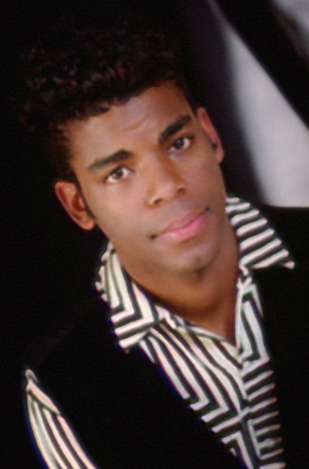

### Original Degraded Image ###


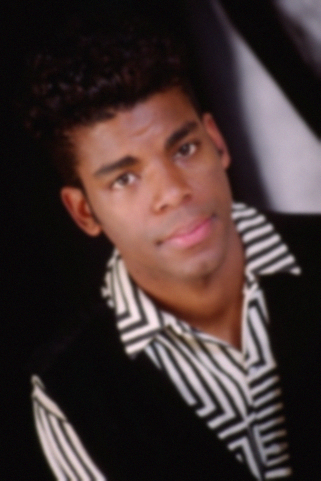

### Original Clear Image ###


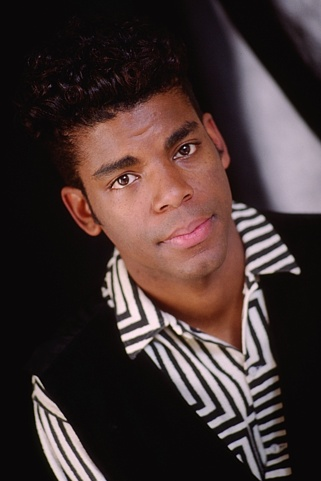

########################################## Displaying second test image ##################################
MSE of the image is 112.18719482421875
### Predicted Clear Image ###


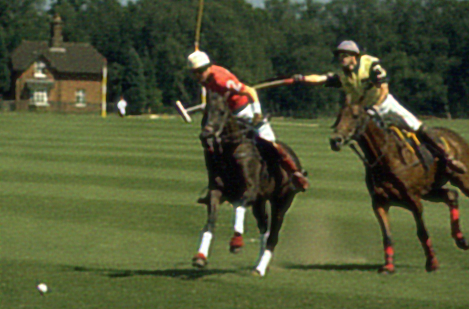

### Original Degraded Image ###


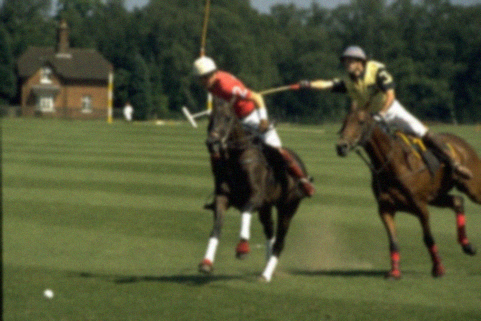

### Original Clear Image ###


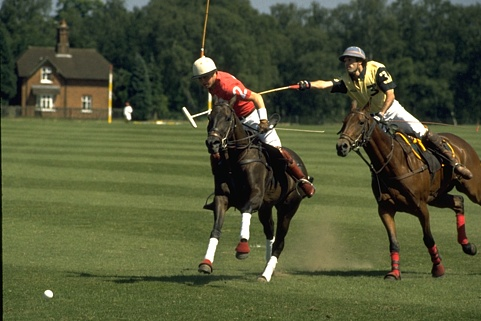

############################## Displaying fourth real test image ###############################
### Predicted Clear Image ###


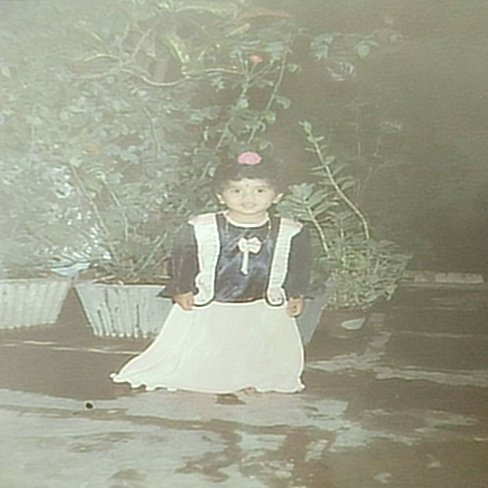

### Original Real Life Degraded Image ###


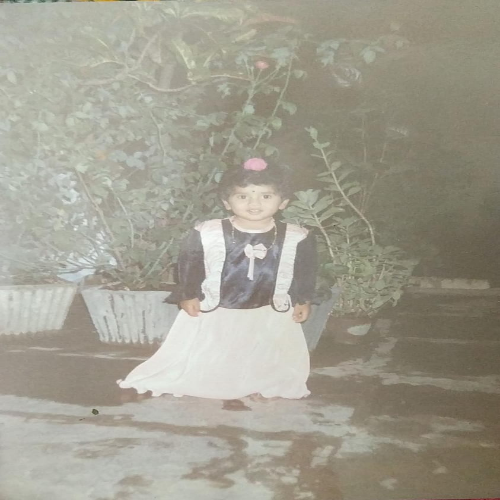

############################## Displaying fifth real test image #################################
### Predicted Clear Image ###


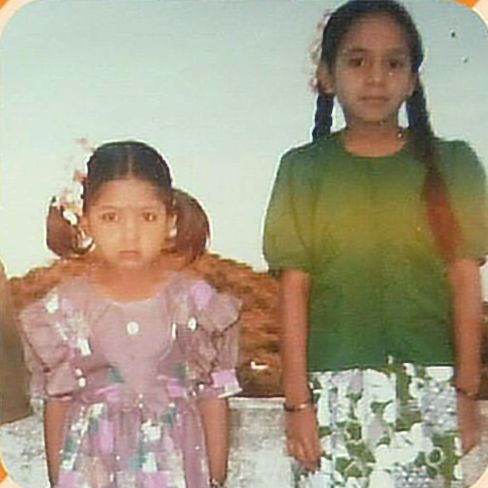

### Original Real Life Degraded Image ###


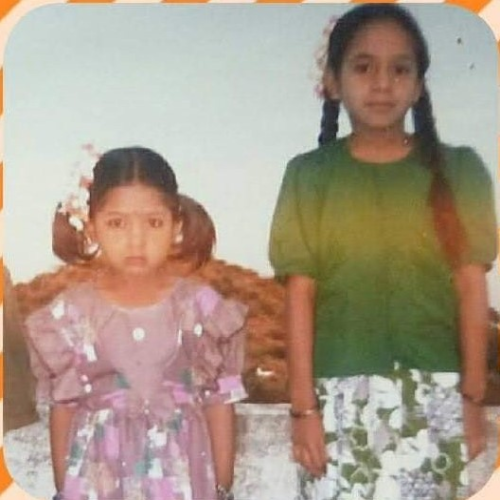

In [ ]:
from sklearn.metrics import mean_squared_error as mse
mse1 = (1/3)*(mse(y1g_pred, y1g_test)+mse(y1b_pred, y1b_test)+mse(y1r_pred, y1r_test))       # finding the mean squared error values for testimages 1 and 2
mse2 = (1/3)*(mse(y2g_pred, y2g_test)+mse(y2b_pred,y2b_test)+mse(y2r_pred,y2r_test))

# combining the central predicted values to form predicted image array
pred1 = combine_central_pixels_rgb(np.array(img1).shape[0]-w+1, np.array(img1).shape[1]-w+1, y1g_pred, y1r_pred, y1b_pred)
pred2 = combine_central_pixels_rgb(np.array(img2).shape[0]-w+1, np.array(img2).shape[1]-w+1, y2g_pred, y2r_pred, y2b_pred)
pred4 = combine_central_pixels_rgb(np.array(img4).shape[0]-w+1, np.array(img4).shape[1]-w+1, y4g_pred, y4r_pred, y4b_pred)
pred5 = combine_central_pixels_rgb(np.array(img5).shape[0]-w+1, np.array(img5).shape[1]-w+1, y5g_pred, y5r_pred, y5b_pred)

print("######################################## Displaying first test image ########################################")
print("MSE of the image is "+ str(mse1))
print("### Predicted Clear Image ###")
cv(pred1)
print("### Original Degraded Image ###")
cv(blur_test_image[0])
print("### Original Clear Image ###")
cv(img1)


print("########################################## Displaying second test image ##################################")
print("MSE of the image is "+ str(mse2))
print("### Predicted Clear Image ###")
cv(pred2)
print("### Original Degraded Image ###")
cv(blur_test_image[1])
print("### Original Clear Image ###")
cv(img2)

print("############################## Displaying fourth real test image ###############################")
# print("MSE of the image is "+ str(mse(y_pred4,y_test4)))
print("### Predicted Clear Image ###")
cv(pred4)
print("### Original Real Life Degraded Image ###")
cv(img4)


print("############################## Displaying fifth real test image #################################")
# print("MSE of the image is "+ str(mse(y_pred5,y_test5)))
print("### Predicted Clear Image ###")
cv(pred5)
print("### Original Real Life Degraded Image ###")
cv(img5)

The size of large odd sized window, W = 23 is taken.

Range of w taken are 13, 15, 17, 19, 21, 23. I will provide the rmse values for w = 13, 21, 23.

Here I considered four images for testing out of which two are taken from the dataset, degraded by blurring and adding noise and then is given to the model to predict central pixels,  and the remaining two are from real life.

Models considered are:


1) CNN model with early stopping with shallow neural networks.

2) CNN model with extra layer to the above model, hence increased complexity, and early stopping is used.

3) Deep Artificial neural Networks.

For the third model, I have trained the three channels separately with three different ann models and combined the result to produce the output.

Initial Guess:

I think the 2nd model should perform better since it is CNN and also has increased complexity than 1st one. Then in the second place I think CNN should
perform well and finally the artificial neural networks.

Observations:

---
For 1st model:

When w = 13, the root mean square errors for the two test images are  8.7 and 11.7 respectively.

When w=21, the mean square errors for the two test images are 13.3 and 12.9 respectively.

When w =23=W, the mean square errors for the two test images are 17.9 and 17.32 respectively.

For 2nd model:


When w = 13, the mean square errors for the two test images are  8.5 and 11.3 respectively.

When w=21, the mean square errors for the two test images are 14.1 and 13.14 respectively.

When w =23=W, the mean square errors for the two test images are 15.23 and 16.67 respectively.


For 3rd model:

When w = 13, the mean square errors for the two test images are 10 and 10.58 respectively.

When w=21, the mean square errors for the two test images are 69 and 70 respectively.

When w =23=W, the mean square errors for the two test images are 68.6 and 67.2 respectively.

Conclusions:

When w=W, and for w=21, the ann model is not at all comparable with the 1st and 2nd cnn models. For all odd window sizes, w>15, the ann model's performance is not comparable with remaining 2 CNN models, and also the performance of the three models keep on decreasing after w>15. 

    Also we can observe that the real degraded images are cleaned to some extent in the three models.

    Overall, I observed  that the 2nd CNN model with increased complexity is performing better than the remaining two models.




References: 

---


1)https://towardsdatascience.com/building-a-convolutional-neural-network-cnn-in-keras-329fbbadc5f5


---
2)Documentation of opencv

---

3)Dataset from https://www2.eecs.berkeley.edu/Research/Projects/CS/vision/bsds/

---
4) Stack overflow

---
5) https://medium.com/analytics-vidhya/image-classification-using-machine-learning-support-vector-machine-svm-dc7a0ec92e01 

---

6)https://scikit-learn.org/stable/auto_examples/ensemble/plot_random_forest_regression_multioutput.html

---
7)https://stackoverflow.com/questions/39308030/how-do-i-increase-the-contrast-of-an-image-in-python-opencvhttps://stackoverflow.com/questions/39308030/how-do-i-increase-the-contrast-of-an-image-in-python-opencv


---

8) https://deepakvraghavan.medium.com/effective-image-recognition-from-hyperparameters-to-convolutional-neural-networks-738859b2e179


---
9) https://www.analyticsvidhya.com/blog/2021/03/the-architecture-of-lenet-5/


